## Importing necessary libraries

In [1]:
from __future__ import print_function, unicode_literals, absolute_import, division
import numpy as np
import matplotlib
matplotlib.rcParams["image.interpolation"] = 'none'
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

from glob import glob
from tqdm import tqdm
from tifffile import imread
from csbdeep.utils import Path, download_and_extract_zip_file

from stardist import fill_label_holes, relabel_image_stardist, random_label_cmap, _draw_polygons, export_imagej_rois 
from stardist.matching import matching_dataset

from stardist.models import StarDist2D
from stardist.data import test_image_nuclei_2d
from stardist.plot import render_label
from csbdeep.utils import normalize
import matplotlib.pyplot as plt

bioimageio_utils.py (2): pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
2025-07-17 00:10:06.990415: I tensorflow/core/util/port.cc:111] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-07-17 00:10:10.526086: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-07-17 00:10:10.526166: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-07-17 00:10:10.526260: E

## Loading and exploring a sample image from the dataset

In [2]:
# Load a 3D .tif image as a stack of 2D frames
image_path = '../Image_Data/old/Top_30_Microns.tif'
label_path2 =  '../Image_Data/old/LblImg_Top_30_Microns.tif' #better annotation

image_stack = imread(image_path)  # Shape: (31, 2048, 2048)
label_stack2 = imread(label_path2)
label_stack2 = np.round(label_stack2).astype(int)

# image_stack is a 3D numpy array with shape (z, y, x), where z is the number of frames
# Each slice image_stack[i] is a 2D frame
print(f"Shape of the stack: {image_stack.shape}")  # (z, y, x)

Shape of the stack: (31, 2048, 2048)


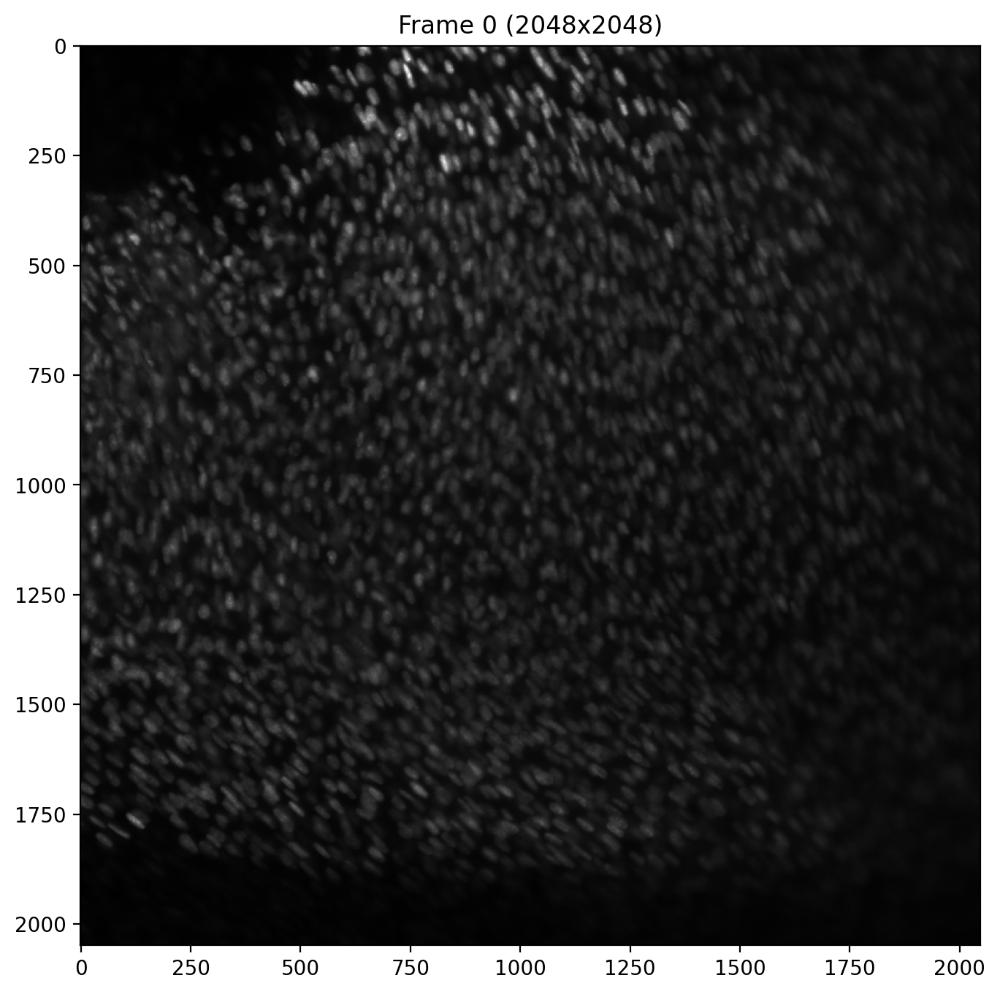

In [3]:
# Display one frame 
plt.figure(figsize=(8, 8))  # Adjust size for better visibility
plt.imshow(image_stack[0],cmap='gray')  # Show the first frame
plt.title('Frame 0 (2048x2048)')
plt.show()

Total frames: 31


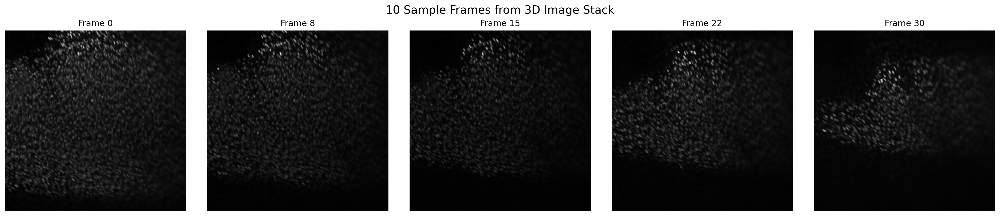

In [5]:
# Number of frames in the stack
num_frames = image_stack.shape[0]
print(f"Total frames: {num_frames}")

# Select 10 evenly spaced frames
frames_to_show = 5
frame_indices = [round(i) for i in np.linspace(0, num_frames - 1, frames_to_show)]

# Plot the selected frames
plt.figure(figsize=(20, 8))
for i, frame_idx in enumerate(frame_indices):
    plt.subplot(2, 5, i + 1)  # 2 rows, 5 columns
    plt.imshow(image_stack[frame_idx], cmap='gray')
    plt.title(f'Frame {frame_idx}')
    plt.axis('off')

plt.suptitle('10 Sample Frames from 3D Image Stack', fontsize=16)
plt.tight_layout()
plt.show()

## Running the Pre-trained stardist 2D model on the sample image

### Extracting a small section from one of the frames and testing the pre-trained 2D model on it

In [9]:
# Extract the section of the frame using slicing for visualisation
frame = image_stack[0]
label0 = label_stack2[0]
section = frame[1000:1250, 250:500]
gt_label_Section = label0[1000:1250, 250:500]

In [10]:
# Loading pre-trained stardist2D model
StarDist2D.from_pretrained()

There are 4 registered models for 'StarDist2D':

Name                  Alias(es)
────                  ─────────
'2D_versatile_fluo'   'Versatile (fluorescent nuclei)'
'2D_versatile_he'     'Versatile (H&E nuclei)'
'2D_paper_dsb2018'    'DSB 2018 (from StarDist 2D paper)'
'2D_demo'             None


In [11]:
model = StarDist2D.from_pretrained('2D_versatile_fluo')

Found model '2D_versatile_fluo' for 'StarDist2D'.


2025-07-17 00:39:22.773844: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1886] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 9647 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 2080 Ti, pci bus id: 0000:19:00.0, compute capability: 7.5


Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


In [12]:
# Making predictions on the cropped section
my_fl_labels, my_fl_details = model.predict_instances(normalize(section), prob_thresh=0.4)

2025-07-17 00:39:24.616690: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:442] Loaded cuDNN version 8700
2025-07-17 00:39:30.787648: W tensorflow/compiler/xla/service/gpu/llvm_gpu_backend/gpu_backend_lib.cc:521] Can't find libdevice directory ${CUDA_DIR}/nvvm/libdevice. This may result in compilation or runtime failures, if the program we try to run uses routines from libdevice.
Searched for CUDA in the following directories:
  ./cuda_sdk_lib
  /usr/local/cuda-11.8
  /usr/local/cuda
  /cephfs/volumes/hpc_home/k24034333/b4e359f7-9fc9-41c1-ae12-4a6ad8f3100e/stardist/lib/python3.11/site-packages/tensorflow/python/platform/../../../nvidia/cuda_nvcc
  /cephfs/volumes/hpc_home/k24034333/b4e359f7-9fc9-41c1-ae12-4a6ad8f3100e/stardist/lib/python3.11/site-packages/tensorflow/python/platform/../../../../nvidia/cuda_nvcc
  .
You can choose the search directory by setting xla_gpu_cuda_data_dir in HloModule's DebugOptions.  For most apps, setting the environment variable XLA_FLAGS=--xla

Text(0.5, 1.0, 'prediction + input overlay')

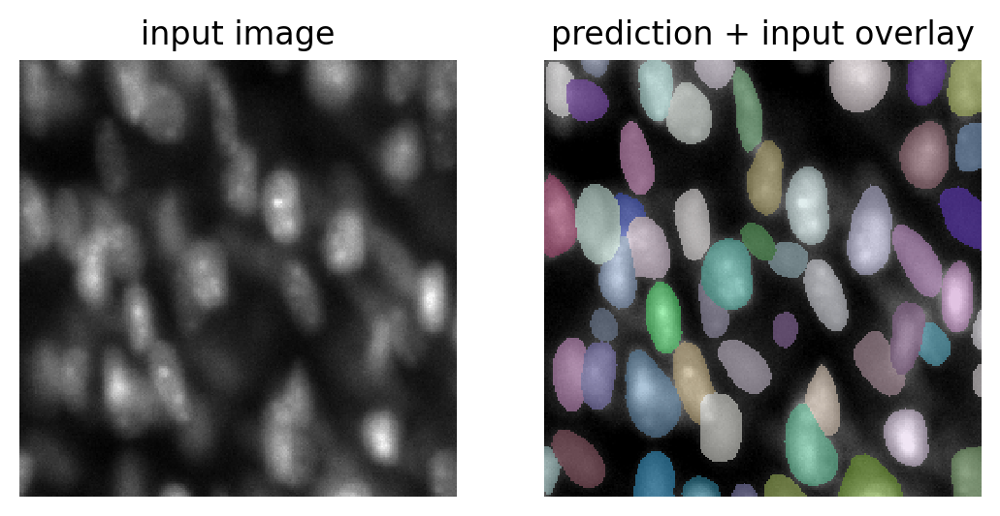

In [13]:
plt.subplot(1,2,1)
plt.imshow(section, cmap="gray")
plt.axis("off")
plt.title("input image")

plt.subplot(1,2,2)
plt.imshow(render_label(my_fl_labels, img=section))
plt.axis("off")
plt.title("prediction + input overlay")

### Loading the Labels/Masks

In [14]:
# Load a 3D .tif image as a stack of 2D frames
label_path = '../Image_Data/old/Top_30_Microns_Labels.tif'
label_stack = imread(label_path)

# image_stack is a 3D numpy array with shape (z, y, x), where z is the number of frames
# Each slice image_stack[i] is a 2D frame

print(f"Shape of the stack: {label_stack.shape}")  # (z, y, x)

Shape of the stack: (31, 2048, 2048)


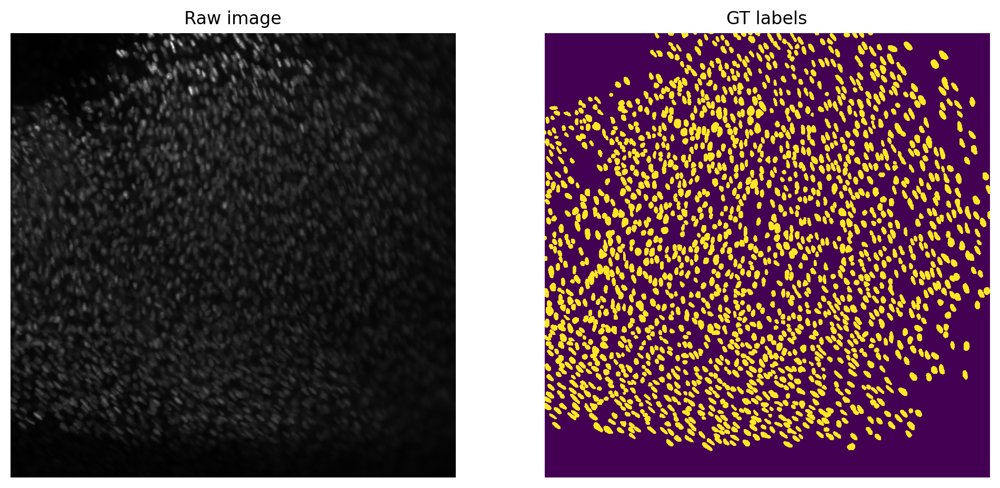

In [15]:
np.random.seed(6)
lbl_cmap = random_label_cmap()

plt.figure(figsize=(12,8))
plt.subplot(121); plt.imshow(image_stack[0],cmap='gray');   plt.axis('off'); plt.title('Raw image')
plt.subplot(122); plt.imshow(label_stack[0]); plt.axis('off'); plt.title('GT labels')
None;

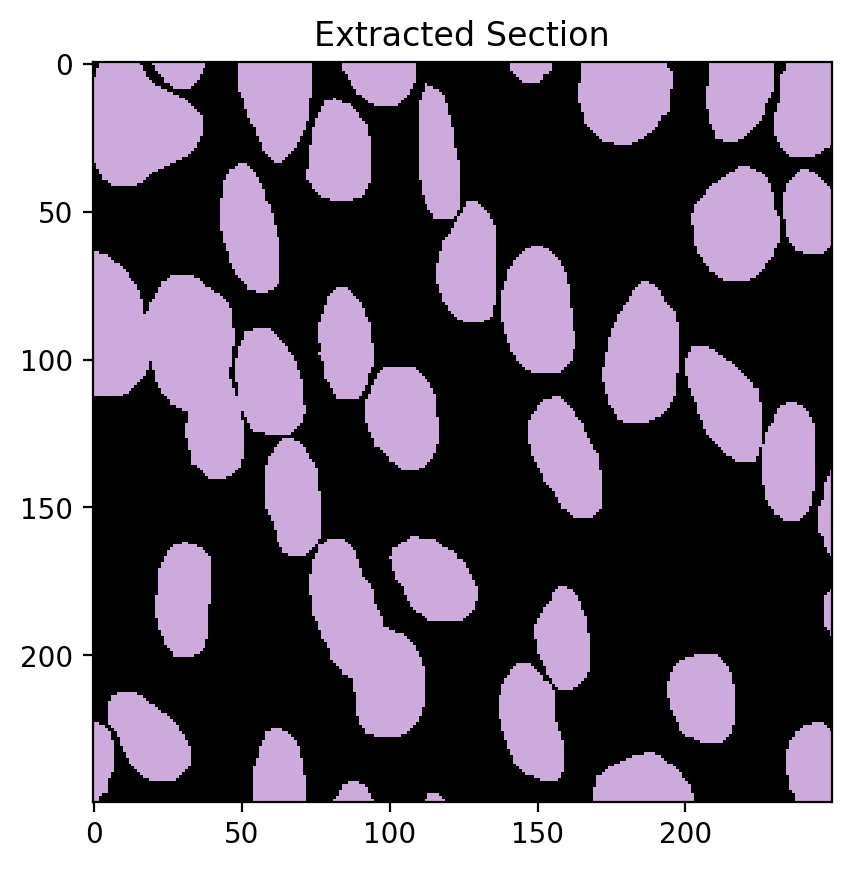

In [16]:
# Extract the corresponding section of the label frame using slicing
lbl_frame = label_stack[0]
lbl_section = lbl_frame[1000:1250, 250:500]

# Visualize the extracted section
import matplotlib.pyplot as plt
plt.imshow(lbl_section, cmap=lbl_cmap)
plt.title("Extracted Section")
plt.show()

In [17]:
from pathlib import Path
import numpy as np

# Define the section coordinates
x_start, x_end = 1000, 1250
y_start, y_end = 250, 500

# Extract sections from each frame
X_section = [img[x_start:x_end, y_start:y_end] for img in image_stack]  # Image sections
Y_section = [lbl[x_start:x_end, y_start:y_end] for lbl in label_stack]  # Label sections

# Check if all extracted sections have the same shape
assert all(x.shape == X_section[0].shape for x in X_section), "Inconsistent image section shapes"
assert all(y.shape == Y_section[0].shape for y in Y_section), "Inconsistent label section shapes"

# Convert to NumPy arrays if needed
X_section = np.array(X_section)
Y_section = np.array(Y_section)

# Print shapes to verify
print(f"X_section shape: {X_section.shape}")  # Expected: (30, 250, 250)
print(f"Y_section shape: {Y_section.shape}")  # Expected: (30, 250, 250)


X_section shape: (31, 250, 250)
Y_section shape: (31, 250, 250)


In [18]:
X_sample = list(X_section[:10])
Y_sample = list(Y_section[:10])

In [19]:
i = min(4, len(X_sample)-1)
img, lbl = X_sample[i], fill_label_holes(Y_sample[i])
assert img.ndim in (2,3)
img = img if img.ndim==2 else img[...,:3]
# assumed axes ordering of img and lbl is: YX(C)

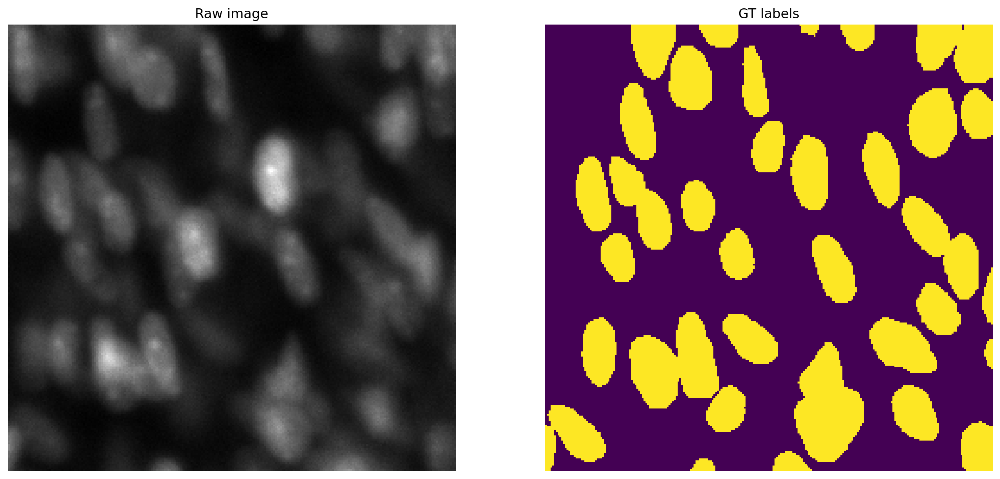

In [20]:
plt.figure(figsize=(16,10))
plt.subplot(121); plt.imshow(img,cmap='gray');   plt.axis('off'); plt.title('Raw image')
plt.subplot(122); plt.imshow(lbl); plt.axis('off'); plt.title('GT labels')
None;

In [21]:
n_rays = [2**i for i in range(2,8)]
scores = []
for r in tqdm(n_rays):
    Y_reconstructed = [relabel_image_stardist(lbl, n_rays=r) for lbl in Y_sample]
    mean_iou = matching_dataset(Y_sample, Y_reconstructed, thresh=0, show_progress=False).mean_true_score
    scores.append(mean_iou)

100%|██████████| 6/6 [00:07<00:00,  1.24s/it]


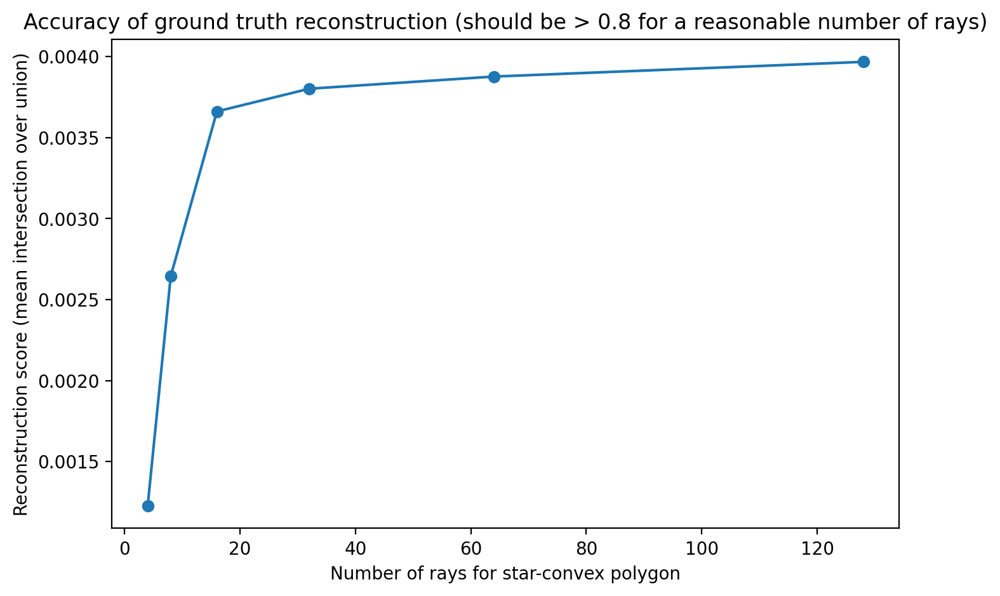

In [22]:
plt.figure(figsize=(8,5))
plt.plot(n_rays, scores, 'o-')
plt.xlabel('Number of rays for star-convex polygon')
plt.ylabel('Reconstruction score (mean intersection over union)')
plt.title("Accuracy of ground truth reconstruction (should be > 0.8 for a reasonable number of rays)")
None;

# Trying Cellpose for 2D segmentation

In [24]:
# Load a 3D .tif image as a stack of 2D frames
image_path = '../Image_Data/old/EHT_Cleared_Hoechst_Deconvolved.tif'
image_stack = imread(image_path)

# image_stack is a 3D numpy array with shape (z, y, x), where z is the number of frames
# Each slice image_stack[i] is a 2D frame

print(f"Shape of the stack: {image_stack.shape}")

Shape of the stack: (400, 2048, 2048)


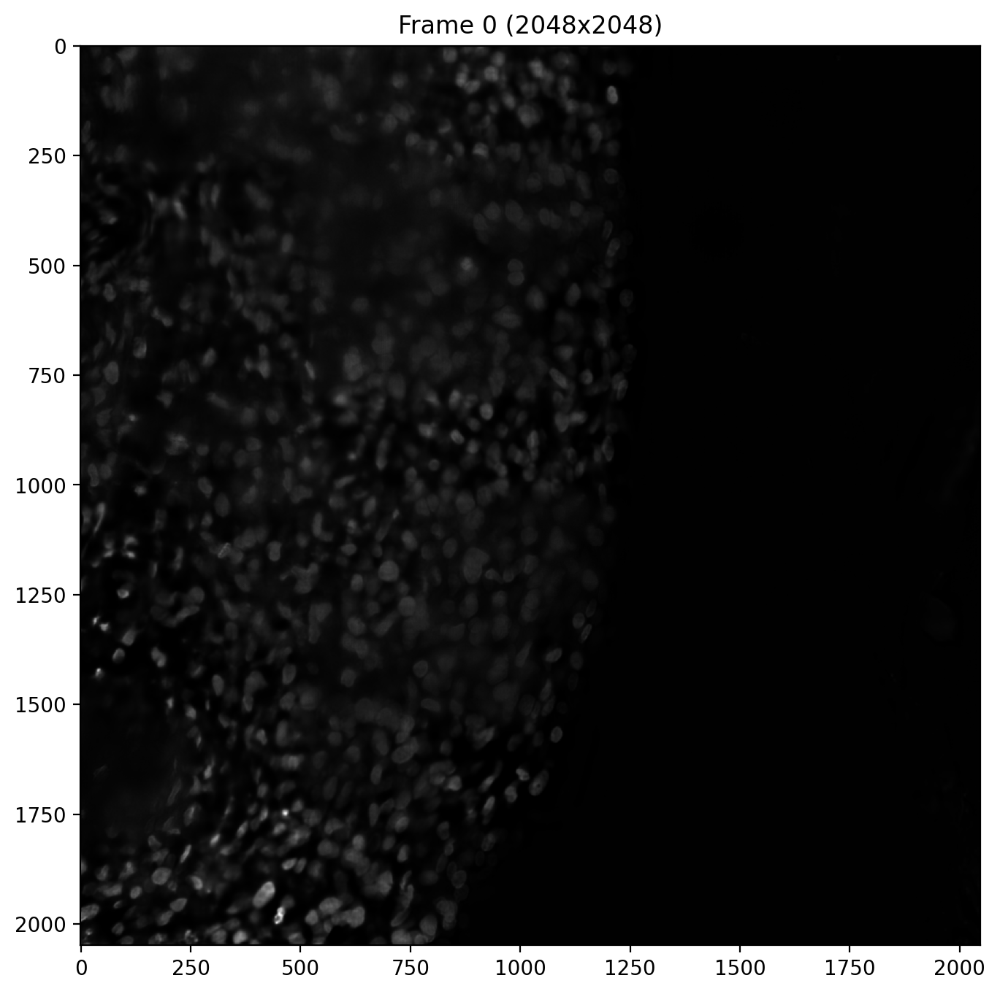

In [25]:
# Display one frame (e.g., the first frame)
plt.figure(figsize=(8, 8))  # Adjust size for better visibility
plt.imshow(image_stack[0],cmap='gray')  # Show the first frame
plt.title('Frame 0 (2048x2048)')
plt.show()

In [26]:
# Number of frames in the stack
num_frames = image_stack.shape[0]
print(f"Total frames: {num_frames}")

Total frames: 400


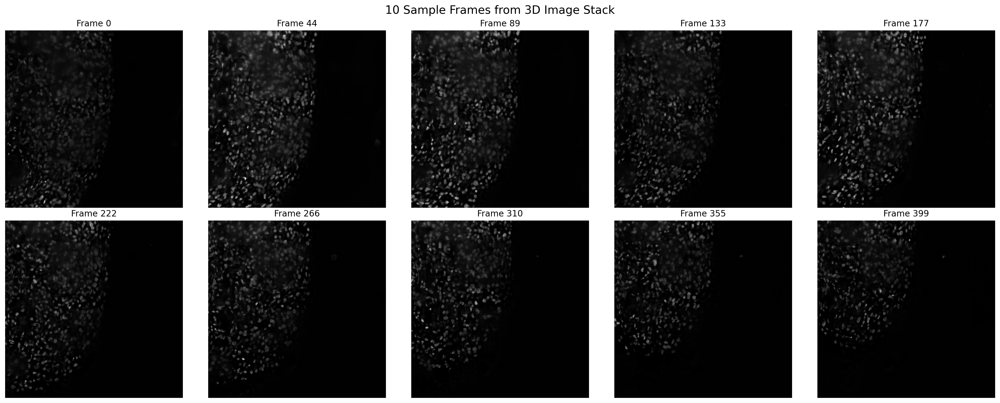

In [27]:
# Select 10 evenly spaced frames
frames_to_show = 10
frame_indices = [round(i) for i in np.linspace(0, num_frames - 1, frames_to_show)]

# Plot the selected frames
plt.figure(figsize=(20, 8))
for i, frame_idx in enumerate(frame_indices):
    plt.subplot(2, 5, i + 1)  # 2 rows, 5 columns
    plt.imshow(image_stack[frame_idx], cmap='gray')
    plt.title(f'Frame {frame_idx}')
    plt.axis('off')

plt.suptitle('10 Sample Frames from 3D Image Stack', fontsize=16)
plt.tight_layout()
plt.show()

In [ ]:
import os, shutil
import numpy as np
import matplotlib.pyplot as plt
from cellpose import core, utils, io, models, metrics
from cellpose import denoise
from glob import glob

In [4]:
model_2 = denoise.CellposeDenoiseModel(
    gpu=True, 
    model_type="nuclei",  #"nuclei" for nuclear segmentation
    restore_type="denoise_nuclei"  # Denoising model for nuclei
)

100%|██████████| 25.3M/25.3M [00:03<00:00, 8.00MB/s]
100%|██████████| 25.3M/25.3M [00:00<00:00, 26.6MB/s]


In [16]:
masks, flows, styles, imgs_dn = model_2.eval(section, diameter=None, channels=[0,0])

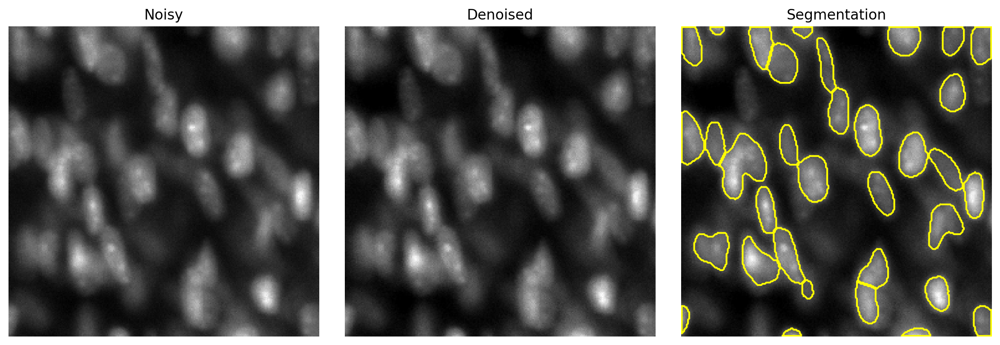

In [19]:
# Create a figure with 3 subplots in one row
plt.figure(figsize=(12, 4))

# Noisy image
plt.subplot(1, 3, 1)
plt.imshow(section, cmap="gray")
plt.axis("off")
plt.title("Noisy")

# Denoised image
plt.subplot(1, 3, 2)
plt.imshow(imgs_dn, cmap="gray", vmin=0, vmax=1)
plt.axis("off")
plt.title("Denoised")

# Segmentation with outlines
plt.subplot(1, 3, 3)
plt.imshow(imgs_dn.squeeze(), cmap="gray", vmin=0, vmax=1)

# Draw segmentation outlines
outlines = utils.outlines_list(masks)
for o in outlines:
    plt.plot(o[:, 0], o[:, 1], color=[1, 1, 0])

plt.axis("off")
plt.title("Segmentation")

plt.tight_layout()
plt.show()

In [36]:
# Making predictions on the denoised cropped section using pre-trained stardist2D
my_fl_labels, my_fl_details = model.predict_instances(normalize(imgs_dn), prob_thresh=0.3)

Text(0.5, 1.0, 'prediction + input overlay')

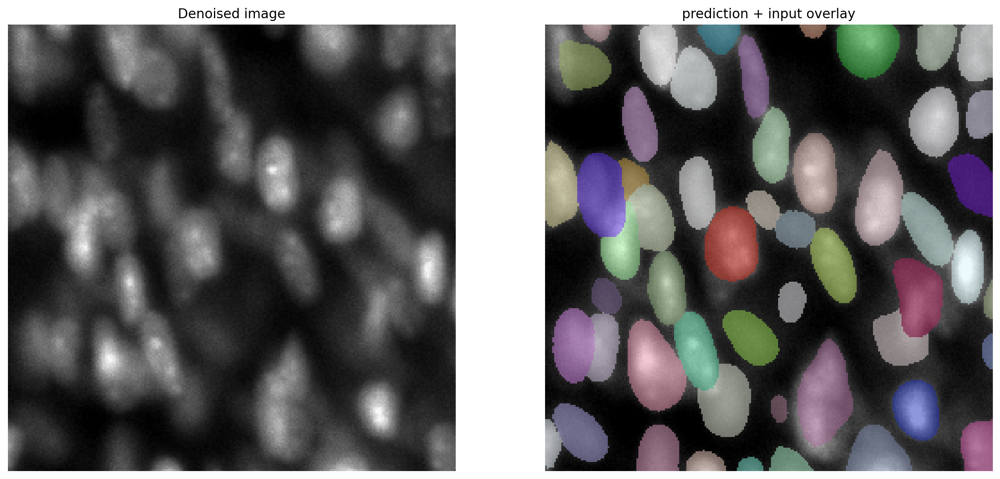

In [37]:
plt.figure(figsize=(16,10))

plt.subplot(1,2,1)
plt.imshow(imgs_dn, cmap="gray")
plt.axis("off")
plt.title("Denoised image")

plt.subplot(1,2,2)
plt.imshow(render_label(my_fl_labels, img=section))
plt.axis("off")
plt.title("prediction + input overlay")

In [38]:
# Making predictions on the orginal cropped section using stardist2D
my_fl_labels_o, my_fl_details_o = model.predict_instances(normalize(section), prob_thresh=0.4)

Text(0.5, 1.0, 'prediction + input overlay')

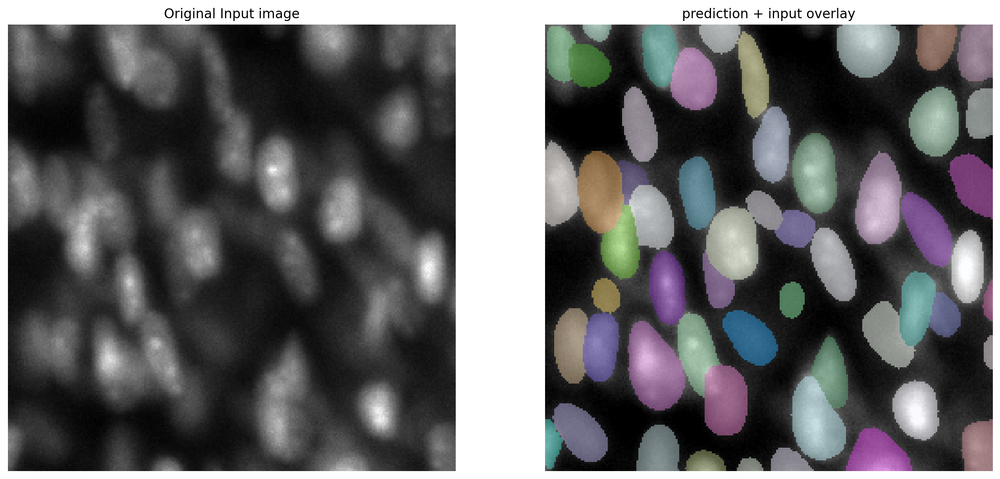

In [39]:
plt.figure(figsize=(16,10))

plt.subplot(1,2,1)
plt.imshow(section, cmap="gray")
plt.axis("off")
plt.title("Original Input image")

plt.subplot(1,2,2)
plt.imshow(render_label(my_fl_labels_o, img=section))
plt.axis("off")
plt.title("prediction + input overlay")

For this dataset, the prediction on the original dataset does better than the denoised version

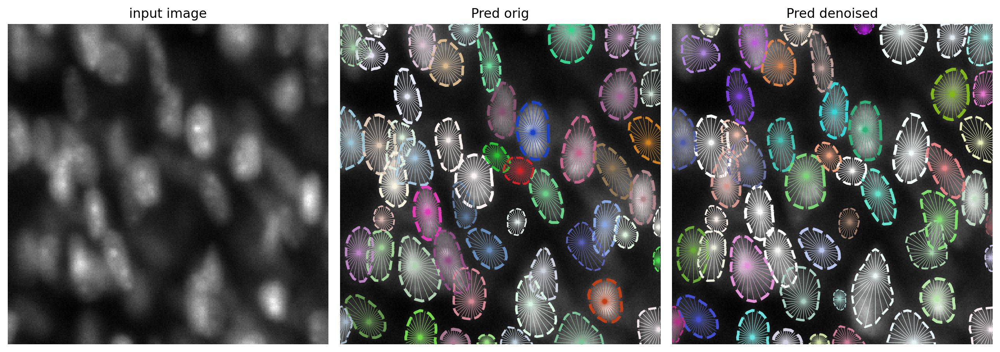

In [41]:
np.random.seed(6)
lbl_cmap = random_label_cmap()

plt.figure(figsize=(13,10))
img_show = section
coord, points, prob = my_fl_details['coord'], my_fl_details['points'], my_fl_details['prob']
coord_o, points_o, prob_o = my_fl_details_o['coord'], my_fl_details_o['points'], my_fl_details_o['prob']

plt.subplot(131)
plt.imshow(section, cmap="gray")
plt.axis("off")
plt.title("input image")

plt.subplot(132); plt.imshow(img_show, cmap='gray'); plt.axis('off')
a = plt.axis()
_draw_polygons(coord_o, points_o, prob_o, show_dist=True)
plt.title("Pred orig")
plt.axis(a)

plt.subplot(133); plt.imshow(img_show, cmap='gray'); plt.axis('off')
a = plt.axis()
_draw_polygons(coord, points, prob, show_dist=True)
plt.title("Pred denoised")
plt.axis(a)
plt.tight_layout()
plt.show()

In [43]:
print(my_fl_details_o.keys())  # check available keys

dict_keys(['coord', 'points', 'prob'])


## Trying Cellpose on Noisy data

In [46]:
# Load a 3D .tif image as a stack of 2D frames
image_path = '../Image_Data/E11.5_Cleared_SiRDNA_Deconvolved.tif'
noisy_img_stack = imread(image_path)

# image_stack is a 3D numpy array with shape (z, y, x), where z is the number of frames
# Each slice image_stack[i] is a 2D frame

print(f"Shape of the stack: {noisy_img_stack.shape}")  # (z, y, x)

Shape of the stack: (281, 2048, 2048)


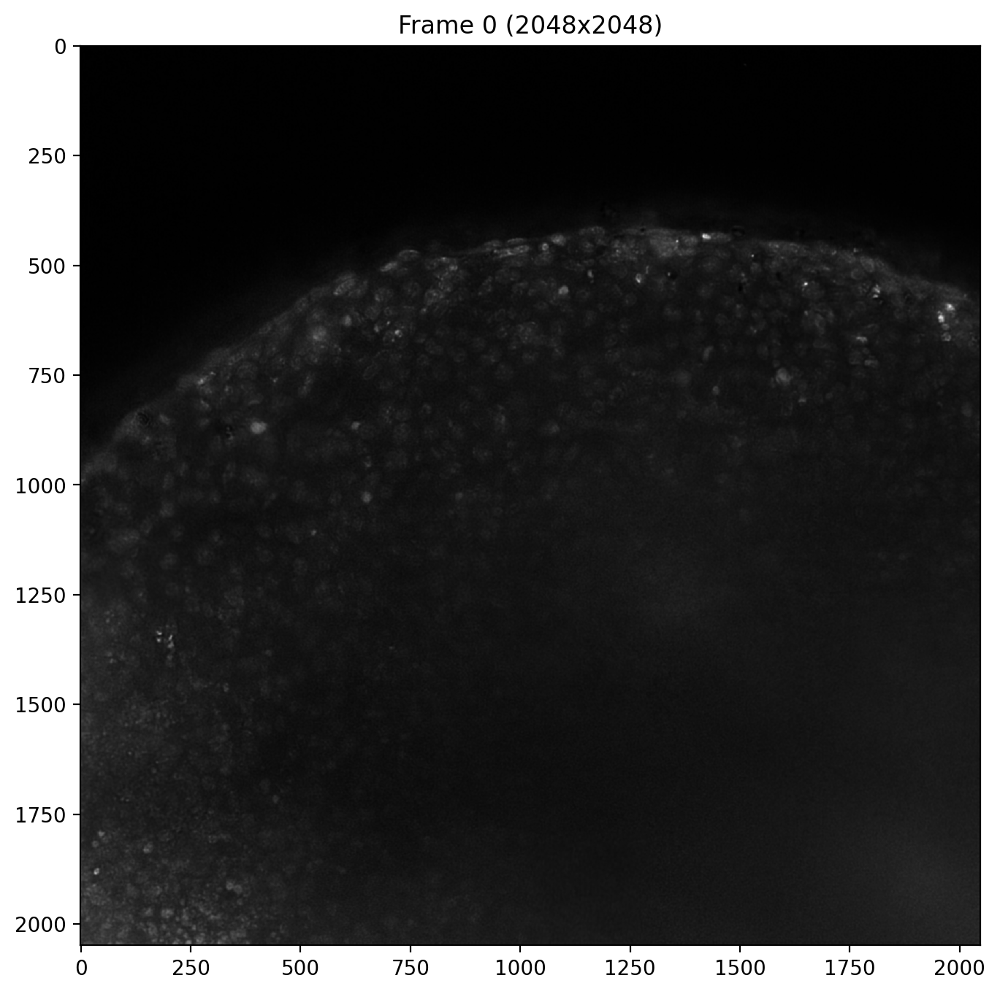

In [48]:
# Display one frame (e.g., the first frame)
plt.figure(figsize=(8, 8))  # Adjust size for better visibility
plt.imshow(noisy_img_stack[0],cmap='gray')  # Show the first frame
plt.title('Frame 0 (2048x2048)')
plt.show()

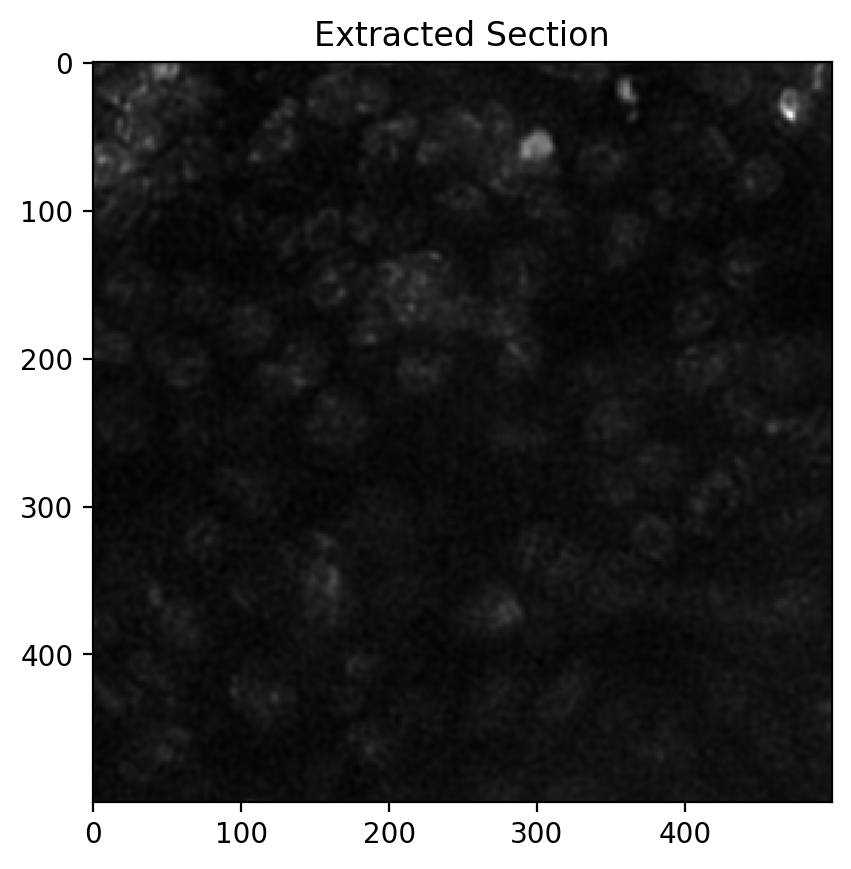

In [51]:
frame_0n = noisy_img_stack[0]
section_2 = frame_0n[500:1000, 800:1300]

# Visualize the extracted section
import matplotlib.pyplot as plt
plt.imshow(section_2, cmap='gray')
plt.title("Extracted Section")
plt.show()

In [53]:
# Applying cellpose3 model
masks_2, flows_2, styles_2, imgs_dn_2 = model_2.eval(section_2, diameter=None, channels=[0,0])

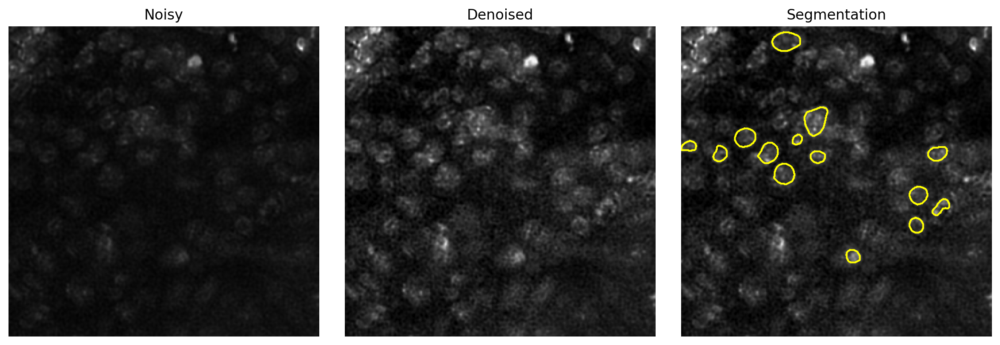

In [55]:
# Create a figure with 3 subplots in one row
plt.figure(figsize=(12, 4))

# Noisy image
plt.subplot(1, 3, 1)
plt.imshow(section_2, cmap="gray")
plt.axis("off")
plt.title("Noisy")

# Denoised image
plt.subplot(1, 3, 2)
plt.imshow(imgs_dn_2, cmap="gray", vmin=0, vmax=1)
plt.axis("off")
plt.title("Denoised")

# Segmentation with outlines
plt.subplot(1, 3, 3)
plt.imshow(imgs_dn_2.squeeze(), cmap="gray", vmin=0, vmax=1)

# Draw segmentation outlines
outlines = utils.outlines_list(masks_2)
for o in outlines:
    plt.plot(o[:, 0], o[:, 1], color=[1, 1, 0])

plt.axis("off")
plt.title("Segmentation")

plt.tight_layout()
plt.show()

In [61]:
my_fl_labels_on, my_fl_details_on = model.predict_instances(normalize(section_2), prob_thresh=0.4)

Text(0.5, 1.0, 'prediction + input overlay')

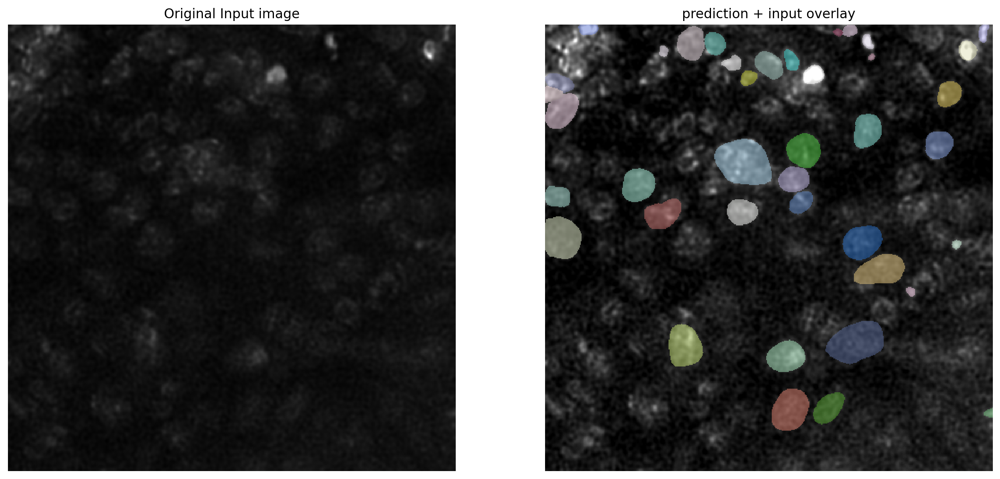

In [63]:
plt.figure(figsize=(16,10))

plt.subplot(1,2,1)
plt.imshow(section_2, cmap="gray")
plt.axis("off")
plt.title("Original Input image")

plt.subplot(1,2,2)
plt.imshow(render_label(my_fl_labels_on, img=section_2))
plt.axis("off")
plt.title("prediction + input overlay")

In [64]:
# Making stardist2D predictions using the predicted denoised section from Cellpose 
my_fl_labels_dn, my_fl_details_dn = model.predict_instances(normalize(imgs_dn_2), prob_thresh=0.4)

Text(0.5, 1.0, 'prediction + input overlay')

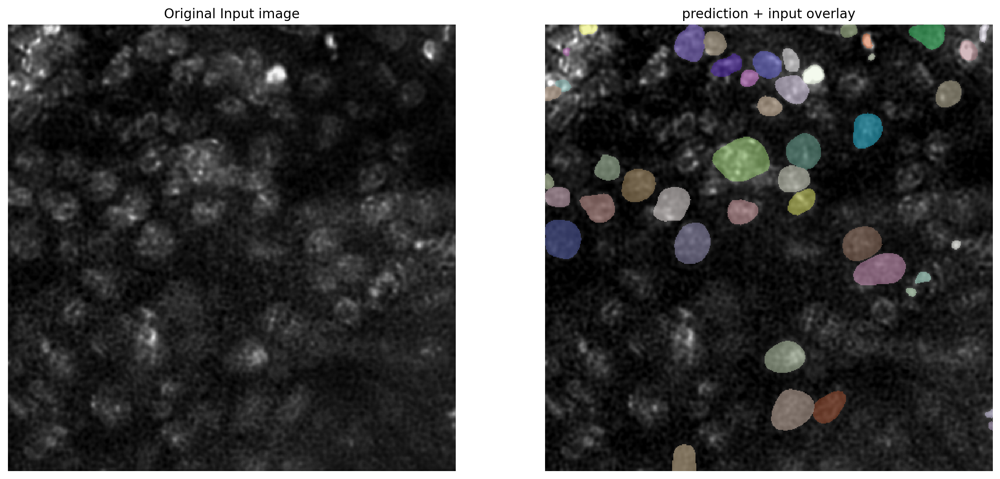

In [67]:
plt.figure(figsize=(16,10))

plt.subplot(1,2,1)
plt.imshow(imgs_dn_2, cmap="gray")
plt.axis("off")
plt.title("Original Input image")

plt.subplot(1,2,2)
plt.imshow(render_label(my_fl_labels_dn, img=section_2))
plt.axis("off")
plt.title("prediction + input overlay")

Segmentation performance using Cellpose and StarDist 2D was suboptimal on noisy SiRDNA-stained E11.5 embryonic mouse heart images. Although denoising module of Cellpose marginally improved visual clarity, it did not enhance segmentation accuracy. In contrast, reporter lines expressing nuclear-localized H2B-GFP yielded markedly improved segmentation outcomes. These results suggest that SiRDNA staining may be inadequate for robust nuclear segmentation in this context, supporting the adoption of transgenic reporters in subsequent imaging workflows. 